# [PyTorch](https://pytorch.org/) deep learning demo
Classification of enzyme inhibitory activity

`Note`: Make sure to **Change Runtime to GPU** before running

`Credit`: Data anonymized from [ChEMBL database](https://www.ebi.ac.uk/chembl/)

In [5]:
!pip install torcheval umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 3.3 MB/s eta 0:00:00


In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from umap import UMAP

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

In [3]:
import torch

from torch import nn
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torch.utils.tensorboard import SummaryWriter

from torcheval.metrics import BinaryAccuracy, BinaryAUPRC, BinaryAUROC, BinaryF1Score

In [18]:
acc_metric = BinaryAccuracy(threshold = 0.5)
f1_metric = BinaryF1Score(threshold = 0.5)
ap_metric = BinaryAUPRC()
auc_metric = BinaryAUROC()

batch_size = 64

## Check whether a GPU is available
GPU and CPU utilize separate memory, so the data and model has to be sent to the corresponding `device`

In [7]:
device = (
    'cuda'
    if torch.cuda.is_available()
    else 'mps'
    if torch.backends.mps.is_available()
    else 'cpu'
)
print(f"Using {device} device")

Using cuda device


## Load the enzyme inhibitory activity dataset

In [8]:
!git clone https://github.com/cmb-chula/nvflare-demo

Cloning into 'nvflare-demo'...
remote: Enumerating objects: 68, done.
remote: Counting objects: 100% (68/68), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 68 (delta 21), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (68/68), 1.47 MiB | 2.41 MiB/s, done.
Resolving deltas: 100% (21/21), done.


## Load inhibitor activity dataset
The dataset has been pre-split

In [41]:
X = pd.read_csv('nvflare-demo/inhibitor-data/X_train.csv', header = 0, index_col = 0)
y = pd.read_csv('nvflare-demo/inhibitor-data/y_train.csv', header = 0, index_col = 0)

X_test = pd.read_csv('nvflare-demo/inhibitor-data/X_test.csv', header = 0, index_col = 0)
y_test = pd.read_csv('nvflare-demo/inhibitor-data/y_test.csv', header = 0, index_col = 0)

### Check data format
Inputs are all binary features

In [12]:
print(X.shape)
X.head(2)

(6171, 531)


,KRFP1,KRFP2,KRFP14,KRFP16,KRFP17,KRFP20,KRFP33,KRFP45,KRFP67,KRFP72,...,KRFP4820,KRFP4823,KRFP4826,KRFP4827,KRFP4829,KRFP4833,KRFP4835,KRFP4843,KRFP4853,KRFP4856
Compound1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Compound2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


Some imbalance (3x more inhibitors than non-inhibitors)

In [13]:
y.value_counts()

,count
class,
1,4556
0,1615


In [48]:
y_test.value_counts()

,count
class,
1,1152
0,391


### Visualize the data distribution with UMAP
Use `metric = jaccard`

In [14]:
umap = UMAP(n_components = 2, n_neighbors = 50, min_dist = 0.25, random_state = 4649, metric = 'jaccard').fit(X)
X_umap = umap.transform(X)

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1887: UserWarning: gradient function is not yet implemented for jaccard distance metric; inverse_transform will be unavailable
  warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [15]:
X_umap_with_result = pd.DataFrame(X_umap[:, :2], columns = ['UMAP1', 'UMAP2'], index = X.index)
X_umap_with_result['Activity'] = ''

X_umap_with_result.loc[y['class'] == 0, 'Activity'] = 'None'
X_umap_with_result.loc[y['class'] == 1, 'Activity'] = 'Inhibitor'

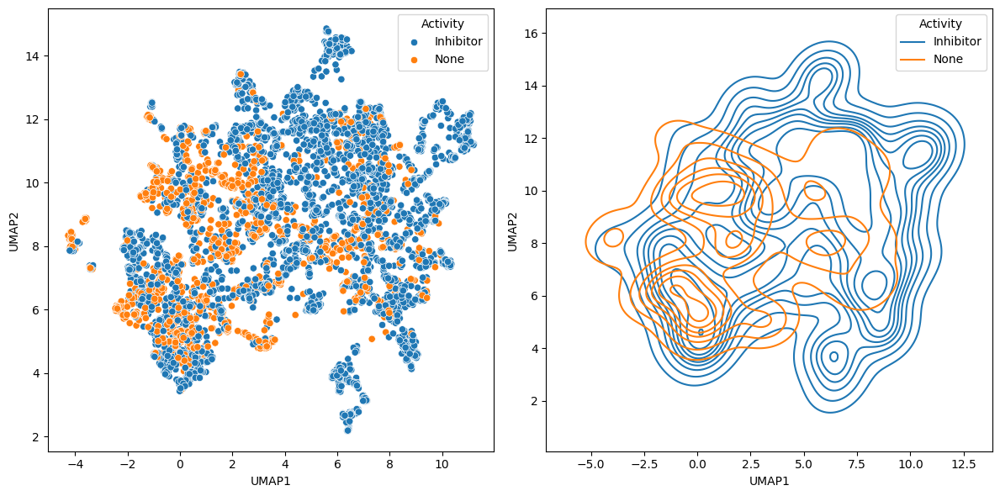

In [16]:
plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1); sns.scatterplot(data = X_umap_with_result, x = 'UMAP1', y = 'UMAP2', hue = 'Activity')
plt.subplot(1, 2, 2); sns.kdeplot(data = X_umap_with_result, x = 'UMAP1', y = 'UMAP2', hue = 'Activity')
plt.tight_layout()
plt.show()

## Split the training set into training and validation (75:25)
We will use the validation set to monitor and stop the training process

In [17]:
X_train, X_val, y_train, y_val = train_test_split(X, y['class'], test_size = 0.25, stratify = y['class'],
                                                  shuffle = True, random_state = 4649)

## Define how the data will be loaded into the model
For deep learning, the whole dataset is usually too large to be loaded into the memory. These steps will load the data as needed on the fly.

Notice how we need to transform `array` that we are used to into `tensor` (essentially multidimensional array)

Here, because we have loaded the entire dataframe, this process will involve only extracting the corresponding rows

In [19]:
class MyDataset(Dataset):
    def __init__(self, X, y):
        self.X = torch.tensor(X.values).type(torch.FloatTensor)
        self.y = torch.tensor(y.values).type(torch.LongTensor)

    def __len__(self):
        return self.X.shape[0]

    def __getitem__(self, idx):
        return self.X[idx, :], self.y[idx]

In [20]:
train_dataloader = DataLoader(MyDataset(X_train, y_train), batch_size = batch_size, shuffle = True)
val_dataloader = DataLoader(MyDataset(X_val, y_val), batch_size = batch_size, shuffle = True)

## Define artificial neural network model
This is a `two-layer feedforward network`. The output is the positive class score (which will be transform into probability later)

In [21]:
input_size = X_train.shape[1]

class ClassificationNetwork(nn.Module):
    def __init__(self, hidden_layers):
        super().__init__()
        self.fc1 = nn.Linear(input_size, hidden_layers[0])
        self.fc2 = nn.Linear(hidden_layers[0], hidden_layers[1])
        self.fc3 = nn.Linear(hidden_layers[1], 1)

    def forward(self, x):
        x = nn.ReLU()(self.fc1(x))
        x = nn.ReLU()(self.fc2(x))
        score = self.fc3(x)

        return score

An example of a network with 128 and 16 hidden neurons in the two layers

In [22]:
model = ClassificationNetwork(hidden_layers = (128, 16))
model.eval()

ClassificationNetwork(
  (fc1): Linear(in_features=531, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=16, bias=True)
  (fc3): Linear(in_features=16, out_features=1, bias=True)
)

## Define the training routine
1. During the **train step**, loss on the training set is used to update model's weights
2. During the **validate step**, loss and performance scores on the validation set were used to keep track of the progress

In [23]:
def train_step(dataloader, model, loss_fn, optimizer, verbose = True):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.train()
    train_loss = 0.0

    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device).float()

        # compute prediction loss to keep track of model performance
        pred = torch.flatten(model(X))
        loss = loss_fn(pred, y)
        train_loss += loss.item()

        # backpropagation to update model's weights
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

    train_loss /= num_batches

    if verbose:
        print(f"Training loss: {train_loss:>8f}")

    return train_loss

In [24]:
def validate_step(dataloader, model, loss_fn, verbose = True):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    val_loss = 0.0

    all_preds = []
    all_ys = []

    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device).float()
            pred = torch.flatten(model(X))
            val_loss += loss_fn(pred, y).item()

            all_preds.append(pred)
            all_ys.append(y)

    val_loss /= num_batches

    all_preds = torch.cat(all_preds, dim = 0)
    all_ys = torch.cat(all_ys, dim = 0)

    acc_metric.update(all_preds, all_ys)
    accuracy = acc_metric.compute()

    auc_metric.update(all_preds, all_ys)
    auc = auc_metric.compute()

    ap_metric.update(all_preds, all_ys)
    ap = ap_metric.compute()

    f1_metric.update(all_preds, all_ys)
    f1 = f1_metric.compute()

    if verbose:
        print(f"  Validation acc: {(accuracy * 100):>0.1f}%, loss: {val_loss:>8f}")

    acc_metric.reset()
    auc_metric.reset()
    ap_metric.reset()
    f1_metric.reset()

    return val_loss, accuracy, auc, ap, f1

### Define the protocol for terminating the training if loss does not improve on the validation set
`patience` defines how many training epochs to tolerate

In [25]:
class EarlyStopping:
    def __init__(self, patience = 5, min_delta = 0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_val_loss = float('inf')

    def early_stop(self, val_loss):
        if val_loss < self.min_val_loss:
            self.min_val_loss = val_loss
            self.counter = 0
        elif val_loss > (self.min_val_loss + self.min_delta):
            self.counter += 1

            if self.counter >= self.patience:
                return True

        return False

### Putting the pieces together
Use `ReduceLROnPlateau` to adaptively reduce the learning rate (slow down the weight update) when the loss stop improving

Use `SummaryWriter` to save the training and validation progress to visualize later (save to `log_dir/run_name`)

`BCEWithLogitsLoss` is the binary cross entropy loss, which measure the error in probability

`Adam` is a popular optimizer for neural network model's weights

This function will do the following:
* Output the training progress into a `tb_events` folder
* Return a trained model at the end

In [29]:
def training_loop(epochs, hidden_layers, init_lr, train_verbose = True, val_verbose = True, log_dir = 'tb_events'):
    nn_model = ClassificationNetwork(hidden_layers).to(device)
    loss = nn.BCEWithLogitsLoss()
    optimizer = torch.optim.Adam(nn_model.parameters(), lr = init_lr)
    early_stopping = EarlyStopping()
    log_writer = SummaryWriter(log_dir = log_dir + '/' + str(hidden_layers))

    for epoch in range(epochs):
        if (epoch + 1) % 20 == 1:
            print('Epoch', epoch + 1, '-------------------------------')

        train_loss = train_step(train_dataloader, nn_model, loss, optimizer, train_verbose)
        val_loss, val_accuracy, val_auc, val_ap, val_f1 = validate_step(val_dataloader, nn_model, loss, val_verbose)

        log_writer.add_scalar('Loss/train', train_loss, epoch)
        log_writer.add_scalar('Loss/val', val_loss, epoch)
        log_writer.add_scalar('Performance/Accuracy', val_accuracy, epoch)
        log_writer.add_scalar('Performance/AUROC', val_auc, epoch)
        log_writer.add_scalar('Performance/AvgPrecision', val_ap, epoch)
        log_writer.add_scalar('Performance/F1', val_f1, epoch)

        if early_stopping.early_stop(val_loss):
            print('EarlyStopping: No loss improvement on the validation set')
            break

    log_writer.flush()

    if epoch + 1 == epochs:
        print('End of training due to epoch limit')

    return nn_model

The first model with 128 and 16 hidden neurons in the two layers

In [32]:
model1 = training_loop(100, (128, 16), 1e-4)

Epoch 1 -------------------------------
Training loss: 0.619488
  Validation acc: 64.0%, loss: 0.585353
Training loss: 0.540403
  Validation acc: 77.4%, loss: 0.505765
Training loss: 0.481627
  Validation acc: 79.0%, loss: 0.477336
Training loss: 0.440271
  Validation acc: 80.0%, loss: 0.448478
Training loss: 0.408726
  Validation acc: 80.2%, loss: 0.433912
Training loss: 0.387761
  Validation acc: 80.8%, loss: 0.417518
Training loss: 0.371903
  Validation acc: 81.2%, loss: 0.418876
Training loss: 0.361701
  Validation acc: 81.3%, loss: 0.402424
Training loss: 0.348729
  Validation acc: 81.6%, loss: 0.379113
Training loss: 0.340708
  Validation acc: 82.0%, loss: 0.384350
Training loss: 0.332114
  Validation acc: 81.8%, loss: 0.372837
Training loss: 0.325253
  Validation acc: 81.7%, loss: 0.373991
Training loss: 0.317979
  Validation acc: 82.4%, loss: 0.370991
Training loss: 0.310542
  Validation acc: 83.0%, loss: 0.375563
Training loss: 0.305277
  Validation acc: 81.5%, loss: 0.354070


The second larger model with 512 and 32 hidden neurons in the two layers

In [33]:
model2 = training_loop(100, (512, 32), 1e-4)

Epoch 1 -------------------------------
Training loss: 0.579606
  Validation acc: 76.1%, loss: 0.520880
Training loss: 0.461601
  Validation acc: 78.9%, loss: 0.450574
Training loss: 0.408563
  Validation acc: 80.4%, loss: 0.417855
Training loss: 0.373235
  Validation acc: 81.4%, loss: 0.399464
Training loss: 0.350071
  Validation acc: 81.9%, loss: 0.389478
Training loss: 0.330277
  Validation acc: 82.2%, loss: 0.374322
Training loss: 0.314225
  Validation acc: 82.3%, loss: 0.377409
Training loss: 0.300413
  Validation acc: 82.7%, loss: 0.374819
Training loss: 0.285769
  Validation acc: 82.4%, loss: 0.347598
Training loss: 0.273549
  Validation acc: 83.1%, loss: 0.344386
Training loss: 0.259238
  Validation acc: 84.2%, loss: 0.333883
Training loss: 0.248301
  Validation acc: 84.0%, loss: 0.321681
Training loss: 0.233761
  Validation acc: 84.6%, loss: 0.312722
Training loss: 0.222683
  Validation acc: 85.2%, loss: 0.308631
Training loss: 0.211734
  Validation acc: 86.1%, loss: 0.312426


## Visualize the training progress via `tensorboard`
Point `tensorboard` to the `tb_events` folder

All models will be loaded

In [34]:
%load_ext tensorboard
%tensorboard --logdir tb_events

<IPython.core.display.Javascript object>

The larger model `model2` clearly achieved much higher performances

## Make prediction for the test data
The code is long because we need to cast the data as `tensor`, send them to `gpu`, get them back, and transform back to `array`

We also perform `torch.sigmoid` to transform raw scores (linear) into probabilities (logistic)

In [35]:
test_pred1 = torch.sigmoid(model1(torch.tensor(X_test.values).type(torch.FloatTensor).to(device))).cpu().detach().numpy()
test_pred2 = torch.sigmoid(model2(torch.tensor(X_test.values).type(torch.FloatTensor).to(device))).cpu().detach().numpy()

In [36]:
test_pred1

array([[0.9353999 ],
       [0.6321202 ],
       [0.99899596],
       ...,
       [0.9978492 ],
       [0.83648604],
       [0.993407  ]], dtype=float32)

## The larger model improve the recall for non-inhibitor and some precision on inhibitor

In [37]:
print(classification_report(y_test['class'], test_pred1 > 0.5))

              precision    recall  f1-score   support

           0       0.81      0.72      0.76       391
           1       0.91      0.94      0.92      1152

    accuracy                           0.88      1543
   macro avg       0.86      0.83      0.84      1543
weighted avg       0.88      0.88      0.88      1543



In [38]:
print(classification_report(y_test['class'], test_pred2 > 0.5))

              precision    recall  f1-score   support

           0       0.79      0.82      0.80       391
           1       0.94      0.93      0.93      1152

    accuracy                           0.90      1543
   macro avg       0.86      0.87      0.87      1543
weighted avg       0.90      0.90      0.90      1543



## Extract the embedding from `model2` to understand how it transform the input data
We can use either the first or the second layer

This is also called the `activation` of the model at those layers

In [39]:
model2.eval()

ClassificationNetwork(
  (fc1): Linear(in_features=531, out_features=512, bias=True)
  (fc2): Linear(in_features=512, out_features=32, bias=True)
  (fc3): Linear(in_features=32, out_features=1, bias=True)
)

In [42]:
activation = {}

def get_activation(name):
    def hook(model, inputs, outputs):
        activation[name] = outputs.detach().cpu()

    return hook

model2.fc1.register_forward_hook(get_activation('fc1'))
model2.fc2.register_forward_hook(get_activation('fc2'))
_ = model2(torch.tensor(X.values).type(torch.FloatTensor).to(device))

### The features were compressed into 512- and 32-dimensional vectors

In [43]:
print(X.shape)
print(activation['fc1'].shape)
print(activation['fc2'].shape)

(6171, 531)
torch.Size([6171, 512])
torch.Size([6171, 32])


## Visualize the embedding distribution with UMAP
Switch to `euclidean` distance because the binary features have been transformed

In [44]:
fc1_umap = UMAP(n_components = 2, n_neighbors = 50, min_dist = 0.25, random_state = 4649,
                metric = 'euclidean').fit_transform(activation['fc1'])
fc2_umap = UMAP(n_components = 2, n_neighbors = 50, min_dist = 0.25, random_state = 4649,
                metric = 'euclidean').fit_transform(activation['fc2'])

/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [45]:
fc1_umap_with_result = pd.DataFrame(fc1_umap, columns = ['UMAP1', 'UMAP2'], index = X.index)
fc1_umap_with_result['Activity'] = ''
fc1_umap_with_result.loc[y['class'] == 0, 'Activity'] = 'None'
fc1_umap_with_result.loc[y['class'] == 1, 'Activity'] = 'Inhibitor'

fc2_umap_with_result = pd.DataFrame(fc2_umap, columns = ['UMAP1', 'UMAP2'], index = X.index)
fc2_umap_with_result['Activity'] = ''
fc2_umap_with_result.loc[y['class'] == 0, 'Activity'] = 'None'
fc2_umap_with_result.loc[y['class'] == 1, 'Activity'] = 'Inhibitor'

### Embedding from the first layer still cannot clearly distinguish the classes

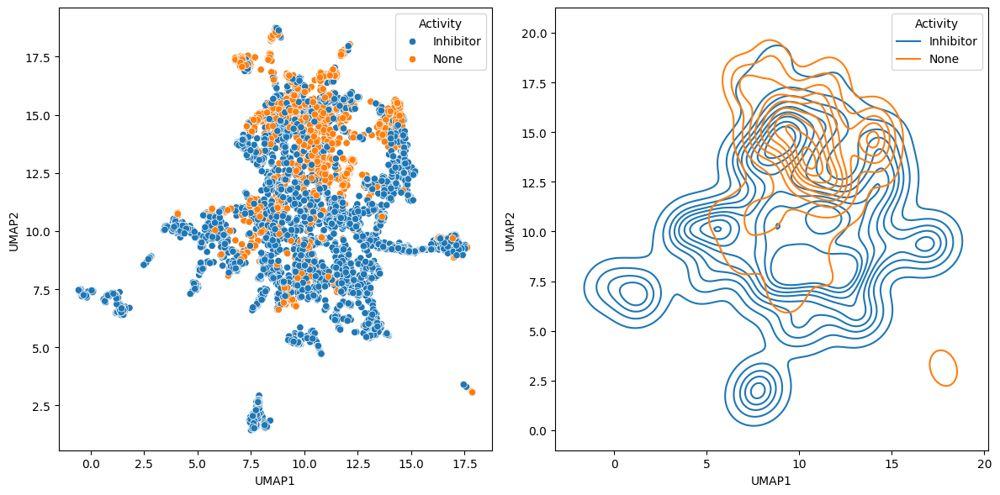

In [46]:
plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1); sns.scatterplot(data = fc1_umap_with_result, x = 'UMAP1', y = 'UMAP2', hue = 'Activity')
plt.subplot(1, 2, 2); sns.kdeplot(data = fc1_umap_with_result, x = 'UMAP1', y = 'UMAP2', hue = 'Activity')
plt.tight_layout()
plt.show()

### Embedding from the second layer clearly distinguish between inhibitors and non-inhibitors
This is how `model2` is able to achieve good performance

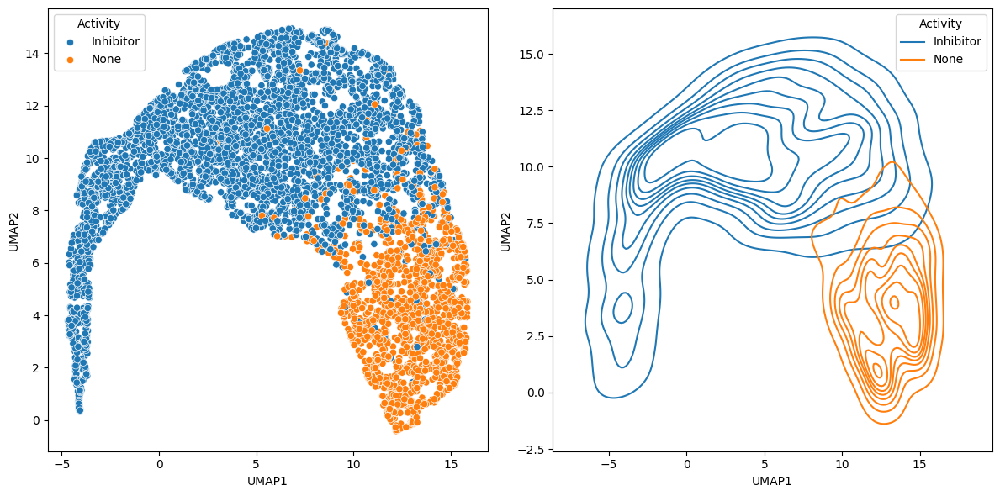

In [47]:
plt.figure(figsize = (12, 6))
plt.subplot(1, 2, 1); sns.scatterplot(data = fc2_umap_with_result, x = 'UMAP1', y = 'UMAP2', hue = 'Activity')
plt.subplot(1, 2, 2); sns.kdeplot(data = fc2_umap_with_result, x = 'UMAP1', y = 'UMAP2', hue = 'Activity')
plt.tight_layout()
plt.show()

## Ideas for further investigations
* Would a larger model achieve even better performance? More hidden neurons or more layers.
* Did the class imbalance affect the model? Weigh the classes differently or using up/down-sampling.
* What are the compounds that are difficult to predict (the boundary between classes in the last UMAP)? Maybe they belong to some chemical classes or come from poor quality experiment.